In [13]:
from fastai.text import *
import html
sns.set()

In [5]:
BOS = 'xbos' # Beginning Of Sentence
FLD = 'xfld' # Field
PATH = Path('data/aclImdb')

In [6]:
CLASS_PATH = Path('data/imdb_class')
CLASS_PATH.mkdir(exist_ok=True)

LM_PATH = Path('data/imdb_lm')
LM_PATH.mkdir(exist_ok=True)

In [7]:
CLASSES = ['neg', 'pos', 'unsup']

def load_texts(path):
    texts, labels = [], []
    for idx, label in enumerate(CLASSES):
        for fname in  (path/label).glob('*.*'):
            texts.append(fname.open('r').read())
            labels.append(idx)
    return np.array(texts), np.array(labels)

## Read data in lists

In [8]:
trn_texts, trn_labels = load_texts(PATH/'train')
val_texts, val_labels = load_texts(PATH/'test')

In [10]:
len(trn_texts), len(val_texts)

(75000, 25000)

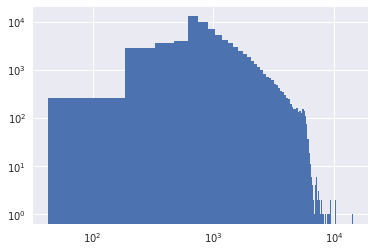

In [19]:
fig, ax = plt.subplots()
pd.Series(trn_texts).apply(len).hist(bins=100, ax=ax)
ax.set_xscale('log')
ax.set_yscale('log')

## Shuffle data

In [22]:
np.random.seed(42)
trn_idx = np.random.permutation(len(trn_texts))
val_idx = np.random.permutation(len(val_texts))

In [23]:
trn_texts = trn_texts[trn_idx]
val_texts = val_texts[val_idx]

trn_labels = trn_labels[trn_idx]
val_labels = val_labels[val_idx]

## Save as csv

In [40]:
col_names = ['labels', 'text']
df_trn = pd.DataFrame({'text':trn_texts, 'labels':trn_labels}, columns=col_names)
df_val = pd.DataFrame({'text':val_texts, 'labels':val_labels}, columns=col_names)

In [49]:
# exclude unsupervised data
df_trn[df_trn['labels']!=2].to_csv(CLASS_PATH/'train.csv', header=False, index=False)
df_val.to_csv(CLASS_PATH/'test.csv', header=False, index=False)
# save class labels info
(CLASS_PATH/'classes.txt').open('w').writelines(f'{o}\n' for o in CLASSES) 

## Merge data for LM - export

In [50]:
trn_texts, val_texts = sklearn.model_selection.train_test_split(
    np.concatenate([trn_texts, val_texts]), test_size=0.1)

In [51]:
len(trn_texts), len(val_texts)

(90000, 10000)

In [52]:
# assign a label of 0 to unsupervised data
df_trn = pd.DataFrame({'text':trn_texts, 'labels':[0]*len(trn_texts)}, columns=col_names)
df_val = pd.DataFrame({'text':val_texts, 'labels':[0]*len(val_texts)}, columns=col_names)

In [53]:
df_trn.to_csv(LM_PATH/'train.csv', header=False, index=False)
df_val.to_csv(LM_PATH/'test.csv', header=False, index=False)

## Tokenize

In [70]:
chunksize=24000
re1 = re.compile(r'  +')

def fixup(x):
    x = x.replace('#39;', "'").replace('amp;', '&').replace('#146;', "'").replace(
        'nbsp;', ' ').replace('#36;', '$').replace('\\n', "\n").replace('quot;', "'").replace(
        '<br />', "\n").replace('\\"', '"').replace('<unk>','u_n').replace(' @.@ ','.').replace(
        ' @-@ ','-').replace('\\', ' \\ ')
    return re1.sub(' ', html.unescape(x))

def get_texts(df, n_labels=1):
    labels = df.iloc[:, range(n_labels)].values.astype(np.int64)
    texts = f'\n{BOS} {FLD} 1 ' + df[n_labels].astype(str)
    for i in range(n_labels+1, len(df.columns)):
        texts += f' {FLD} {i-n_labels} ' + df[i].astype(str)
    texts = texts.apply(fixup).values.astype(str)
    tok = Tokenizer().proc_all_mp(partition_by_cores(texts))
    return tok, list(labels)

In [58]:
Tokenizer, Tokenizer.proc_all_mp, partition_by_cores

(fastai.text.Tokenizer,
 <function fastai.text.Tokenizer.proc_all_mp>,
 <function fastai.core.partition_by_cores>)

In [71]:
def get_all(df, n_labels):
    tok, labels = [], []
    for i, chunk in enumerate(df):
        print(i)
        tok_, labels_ = get_texts(chunk, n_labels)
        tok += tok_
        labels += labels_
    return tok, labels

In [68]:
df_trn = pd.read_csv(LM_PATH/'train.csv', header=None, chunksize=chunksize)
df_val = pd.read_csv(LM_PATH/'test.csv', header=None, chunksize=chunksize)

In [72]:
tok_trn, trn_labels = get_all(df_trn, 1)
tok_val, val_labels = get_all(df_val, 1)

0
1
2
3
0


In [77]:
(LM_PATH/'tmp').mkdir(exist_ok=True)

In [78]:
tok_trn

[['\n',
  'xbos',
  'xfld',
  '1',
  'i',
  'enjoyed',
  'the',
  'taped',
  'stage',
  'play',
  'setting',
  'and',
  'all',
  'of',
  'the',
  'characters',
  'were',
  'immediately',
  'familiar',
  'to',
  'me',
  ',',
  'having',
  'just',
  'viewed',
  'the',
  '1942',
  'version',
  '.',
  'i',
  'rarely',
  'miss',
  'anything',
  'that',
  'nathan',
  'lane',
  'does',
  'and',
  'thought',
  'him',
  'perfect',
  'casting',
  'as',
  'sheridan',
  'whiteside',
  '.',
  '\n\n',
  'however',
  '...',
  'it',
  'all',
  'seemed',
  'a',
  'bit',
  'forced',
  'to',
  'me',
  '.',
  'lane',
  "'s",
  'delivery',
  'was',
  'good',
  'and',
  'his',
  'mugging',
  'very',
  'funny',
  ',',
  'but',
  'he',
  'was',
  'working',
  'all',
  'the',
  'time',
  '.',
  'it',
  'just',
  'did',
  "n't",
  'seem',
  'to',
  'come',
  'naturally',
  '.',
  'the',
  '"',
  'banjo',
  '"',
  'character',
  'was',
  'just',
  'an',
  'impersonation',
  'of',
  'durante',
  'and',
  'an',
  

In [ ]:
np.save(LM_PATH/'tmp'/'tok_trn.npy', tok_trn)
np.save

In [76]:
max_vocab = 60000

[['\n',
  'xbos',
  'xfld',
  '1',
  'i',
  'enjoyed',
  'the',
  'taped',
  'stage',
  'play',
  'setting',
  'and',
  'all',
  'of',
  'the',
  'characters',
  'were',
  'immediately',
  'familiar',
  'to',
  'me',
  ',',
  'having',
  'just',
  'viewed',
  'the',
  '1942',
  'version',
  '.',
  'i',
  'rarely',
  'miss',
  'anything',
  'that',
  'nathan',
  'lane',
  'does',
  'and',
  'thought',
  'him',
  'perfect',
  'casting',
  'as',
  'sheridan',
  'whiteside',
  '.',
  '\n\n',
  'however',
  '...',
  'it',
  'all',
  'seemed',
  'a',
  'bit',
  'forced',
  'to',
  'me',
  '.',
  'lane',
  "'s",
  'delivery',
  'was',
  'good',
  'and',
  'his',
  'mugging',
  'very',
  'funny',
  ',',
  'but',
  'he',
  'was',
  'working',
  'all',
  'the',
  'time',
  '.',
  'it',
  'just',
  'did',
  "n't",
  'seem',
  'to',
  'come',
  'naturally',
  '.',
  'the',
  '"',
  'banjo',
  '"',
  'character',
  'was',
  'just',
  'an',
  'impersonation',
  'of',
  'durante',
  'and',
  'an',
  